# Lending Club Case Study
A consumer finance company which specialises in lending various types of loans to urban customers. When the company receives a loan application, the company has to make a decision for loan approval based on the applicant’s profile. Two types of risks are associated with the bank’s decision:

If the applicant is likely to repay the loan, then not approving the loan results in a loss of business to the company

If the applicant is not likely to repay the loan, i.e. he/she is likely to default, then approving the loan may lead to a financial loss for the company

 

The data given below contains the information about past loan applicants and whether they ‘defaulted’ or not. The aim is to identify patterns which indicate if a person is likely to default, which may be used for taking actions such as denying the loan, reducing the amount of loan, lending (to risky applicants) at a higher interest rate, etc

In [1]:
#Importing necessary libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('ggplot')
plt.rcParams['figure.figsize'] = (16,9)

In [2]:
#Reading LC dataset present in loan.csv file and storing in loan_applicants 
loan_applicants = pd.read_csv('./loan.csv')

#Displaying first 5 rows of the loan_applicants
loan_applicants.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


In [3]:
#Fetching information about all the columns present in loan applicants dataset
loan_applicants.info(max_cols=120)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 111 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              39717 non-null  int64  
 1   member_id                       39717 non-null  int64  
 2   loan_amnt                       39717 non-null  int64  
 3   funded_amnt                     39717 non-null  int64  
 4   funded_amnt_inv                 39717 non-null  float64
 5   term                            39717 non-null  object 
 6   int_rate                        39717 non-null  object 
 7   installment                     39717 non-null  float64
 8   grade                           39717 non-null  object 
 9   sub_grade                       39717 non-null  object 
 10  emp_title                       37258 non-null  object 
 11  emp_length                      38642 non-null  object 
 12  home_ownership                 

## Data Cleaning
Data cleaning is one of the most important steps in a data analysis proccess. Without cleaning, data can lead to errorneous results.

### 1. Missing Value Treatment

In [4]:
'''
Determines the number of missing values in each of the variable of dataset and returns ONLY the variables with atleast one missing value.
'''
def computeMissingValueProportions(df):
    result = round(df.isna().sum() / df.shape[0] *100, 2)
    return result[result.values > 0]

In [5]:
#Computing missing values in percentage for all the columns
available_value_distribution = computeMissingValueProportions(loan_applicants)
available_value_distribution

emp_title                       6.19
emp_length                      2.71
desc                           32.58
title                           0.03
mths_since_last_delinq         64.66
                               ...  
tax_liens                       0.10
tot_hi_cred_lim               100.00
total_bal_ex_mort             100.00
total_bc_limit                100.00
total_il_high_credit_limit    100.00
Length: 68, dtype: float64

There are some columns which are completely empty or hold Null values. Lets confirm this by checking random columns out of the above values

In [6]:
#Fetching all the columns with 100% values as null, if present in dataset
cols = available_value_distribution[available_value_distribution ==100].sample(n=10, random_state=4)
print(cols)
loan_applicants[cols.index]

tot_coll_amt                100.0
inq_last_12m                100.0
total_bc_limit              100.0
avg_cur_bal                 100.0
il_util                     100.0
mths_since_recent_bc_dlq    100.0
mo_sin_rcnt_tl              100.0
num_bc_sats                 100.0
open_acc_6m                 100.0
total_rev_hi_lim            100.0
dtype: float64


,tot_coll_amt,inq_last_12m,total_bc_limit,avg_cur_bal,il_util,mths_since_recent_bc_dlq,mo_sin_rcnt_tl,num_bc_sats,open_acc_6m,total_rev_hi_lim
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
39712,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39713,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39714,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39715,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


So we see the values in these columns are null values. Infact we cannot work with variables with more than 80% of missing data. Hence, we need to drop such columns with more than 80% of the rows being empty.

In [7]:
#Getting column which have more than 80% of data as missing
cols = available_value_distribution[available_value_distribution >=80]


In [8]:
#Dropping the columns with more than 80% missing data 
loan_applicants.drop(axis=1, labels=cols.index, inplace=True)

Now let's examine the data further to see how many values are missing in each variable

In [9]:
#Computing missing values in percentage for all the columns
computeMissingValueProportions(loan_applicants)

emp_title                      6.19
emp_length                     2.71
desc                          32.58
title                          0.03
mths_since_last_delinq        64.66
revol_util                     0.13
last_pymnt_d                   0.18
last_credit_pull_d             0.01
collections_12_mths_ex_med     0.14
chargeoff_within_12_mths       0.14
pub_rec_bankruptcies           1.75
tax_liens                      0.10
dtype: float64

There are several variables which are missing a handful of values <1%. We can drop such customer's data since this is very small proportion.

In [10]:
#Fetching columns, if available in dataset, with missing data between 0-1%
cols_with_1_percent_nulls = available_value_distribution[(available_value_distribution.values > 0) & (available_value_distribution < 1)].index

In [11]:
#dropping rows with missing values for above fetched columns
loan_applicants.dropna(subset=cols_with_1_percent_nulls,inplace=True)

In [12]:
#Computing missing values in percentage for all the columns
computeMissingValueProportions(loan_applicants)

emp_title                  6.16
emp_length                 2.70
desc                      32.60
mths_since_last_delinq    64.73
pub_rec_bankruptcies       1.62
dtype: float64

Now that the missing values have been removed from most of the variables. Let's analyse the ones which hold more significance.

In [13]:
#Fetching the value count for pub_rec_bankruptcies
round(loan_applicants['pub_rec_bankruptcies'].value_counts() / loan_applicants.shape[0] *100, 2)

0.0    94.15
1.0     4.21
2.0     0.02
Name: pub_rec_bankruptcies, dtype: float64

In [14]:
#Finding number of applicants for which pub_rec_bankruptcies data is missing
loan_applicants[loan_applicants['pub_rec_bankruptcies'].isna()].shape[0]

642

So there are 642 customers whose data about number of public record bankruptcies is not available. On analysing the data for the kind of values, we find the values to be 0, 1, or 2, with 0 bankruptcy records prevailing in 94% of the customers. Hence we can impute the value as 0.

In [15]:
#Imputing the null values for pub_rec_bankruptcies with 0
loan_applicants['pub_rec_bankruptcies'].fillna(0, inplace=True)

In [16]:
#Computing missing values in percentage for all the columns
computeMissingValueProportions(loan_applicants)

emp_title                  6.16
emp_length                 2.70
desc                      32.60
mths_since_last_delinq    64.73
dtype: float64

Description provided by the borrower can vary a lot since it is a free form field in a loan application. Also, it does not affect the defaulting probability of the borrower. Hence we can drop the description variable. Also, the employee title/designation wont affect the defaulting of a customer so we can drop that as well.

In [17]:
#Dropping  columns desc and emp_title
loan_applicants.drop(labels=['desc', 'emp_title'], axis=1, inplace=True)

In [18]:
#Computing missing values in percentage for all the columns
computeMissingValueProportions(loan_applicants)

emp_length                 2.70
mths_since_last_delinq    64.73
dtype: float64

Now, we can see the employee work experience are missing for several customers. Since the proportion is very small, we can drop the missing values.

In [19]:
loan_applicants.dropna(subset=['emp_length'], inplace=True)

So borrowers with missing data on their experience have been excluded from further analysis. Let's move to our last variable with missing values- mths_since_last_delinq.

In [20]:
#Get insights for mths_since_last_delinq column
loan_applicants['mths_since_last_delinq'].describe()

count    13602.000000
mean        35.956992
std         21.969503
min          0.000000
25%         18.000000
50%         34.000000
75%         52.000000
max        120.000000
Name: mths_since_last_delinq, dtype: float64

There is not much difference between mean and median of the values of mths_since_last_delinq. Thus imputing mean

In [21]:
#Imputing missing value for mths_since_last_delinq with mean of all the available values
loan_applicants['mths_since_last_delinq'].fillna(loan_applicants['mths_since_last_delinq'].mean(),inplace=True)

In [22]:
#Computing missing values in percentage for all the columns
computeMissingValueProportions(loan_applicants)

Series([], dtype: float64)

**Now all the missing values have been treated for our analysis.**

### 2. Filtering redundant/unnecessary variables

Let's reset our index

In [23]:
loan_applicants.reset_index(drop=True, inplace=True)
loan_applicants.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,last_pymnt_amnt,last_credit_pull_d,collections_12_mths_ex_med,policy_code,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,171.62,16-May,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,119.66,13-Sep,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,...,649.91,16-May,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,...,357.48,16-Apr,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
4,1075358,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,...,67.79,16-May,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0


We see there are lots of variables in our dataset. Let's see if we can narrow down our scope of analysis by reasonably removing one or some of them.

In [24]:
#Fetching available columns in dataset after treating missing values
loan_applicants.columns

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_length',
       'home_ownership', 'annual_inc', 'verification_status', 'issue_d',
       'loan_status', 'pymnt_plan', 'url', 'purpose', 'title', 'zip_code',
       'addr_state', 'dti', 'delinq_2yrs', 'earliest_cr_line',
       'inq_last_6mths', 'mths_since_last_delinq', 'open_acc', 'pub_rec',
       'revol_bal', 'revol_util', 'total_acc', 'initial_list_status',
       'out_prncp', 'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv',
       'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'recoveries',
       'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt',
       'last_credit_pull_d', 'collections_12_mths_ex_med', 'policy_code',
       'application_type', 'acc_now_delinq', 'chargeoff_within_12_mths',
       'delinq_amnt', 'pub_rec_bankruptcies', 'tax_liens'],
      dtype='object')

We can see there are 2 columns in our dataset which might define the intention of loan - title and purpose. Let's see what kind of values we can find with the nature of these variables.

In [25]:
#Generating a random sample of size 10 for title column
np.random.seed(13)
np.random.choice(loan_applicants['title'].str.lower().unique(), size=10)

array([' debt consolidation for recent grad.',
       'pay off debt, purchase used car', 'smaller loan',
       'get-out-of-debt loan', 'credit card consolidating', 'cash1',
       '$5k loan for startup business in ny', 'trying to get debt free',
       'custody legal bills', 'help me consolidate - win win 4 us both'],
      dtype=object)

In [26]:
#Fetching value counts for purpose column
loan_applicants['purpose'].value_counts()

debt_consolidation    18188
credit_card            4982
other                  3804
home_improvement       2864
major_purchase         2103
small_business         1768
car                    1494
wedding                 926
medical                 666
moving                  555
house                   365
vacation                349
educational             307
renewable_energy         94
Name: purpose, dtype: int64

As evident from the output above, the title and purpose columns are highly similar.

Title column has values like 'bye bye credit cards!', 'credit cards pay off' which correspond to the purpose 'credit_card'. Similarly 'home improvement & wedding exp granddaug' correspond to purpose 'home_improvement' and 'wedding' 

Thus, it can be concluded that purpose column defines the purpose/intention of loan better than the title.

Hence, title is the redundant column in our dataset and can be dropped off.

In [27]:
#Dropping title column
loan_applicants.drop(columns='title',inplace=True)

In [28]:
#Fetching available columns in dataset
loan_applicants.columns

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_length',
       'home_ownership', 'annual_inc', 'verification_status', 'issue_d',
       'loan_status', 'pymnt_plan', 'url', 'purpose', 'zip_code', 'addr_state',
       'dti', 'delinq_2yrs', 'earliest_cr_line', 'inq_last_6mths',
       'mths_since_last_delinq', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util', 'total_acc', 'initial_list_status', 'out_prncp',
       'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp',
       'total_rec_int', 'total_rec_late_fee', 'recoveries',
       'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt',
       'last_credit_pull_d', 'collections_12_mths_ex_med', 'policy_code',
       'application_type', 'acc_now_delinq', 'chargeoff_within_12_mths',
       'delinq_amnt', 'pub_rec_bankruptcies', 'tax_liens'],
      dtype='object')

Notice, there are `id`, `memberId`, `url` of website columns in our dataset which seems to not have any impact on our loan status.

Thus we can drop these unnecessary columns.


In [29]:
#Dropping unnecessary columns: 'id','member_id','url'
loan_applicants.drop(columns=['id','member_id','url'],inplace=True)

In [30]:
loan_applicants.head()

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,...,last_pymnt_amnt,last_credit_pull_d,collections_12_mths_ex_med,policy_code,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens
0,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,10+ years,RENT,...,171.62,16-May,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
1,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,< 1 year,RENT,...,119.66,13-Sep,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
2,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,10+ years,RENT,...,649.91,16-May,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
3,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,10+ years,RENT,...,357.48,16-Apr,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0
4,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,1 year,RENT,...,67.79,16-May,0.0,1,INDIVIDUAL,0,0.0,0,0.0,0.0


We see there are several variables which are having only single value, like    `application_type`, `policy_code`, etc. This indicates a possibility that the variables might be univalued. Without any variation, they are as good as not present at all.

Let's check the number of possible values occuring in each column

In [31]:
#Finding number of unique values in all the columns of dataset
loan_applicants.apply(lambda x: x.nunique())

loan_amnt                       879
funded_amnt                    1037
funded_amnt_inv                8084
term                              2
int_rate                        371
installment                   15082
grade                             7
sub_grade                        35
emp_length                       11
home_ownership                    5
annual_inc                     5086
verification_status               3
issue_d                          53
loan_status                       3
pymnt_plan                        1
purpose                          14
zip_code                        820
addr_state                       50
dti                            2863
delinq_2yrs                      11
earliest_cr_line                515
inq_last_6mths                    9
mths_since_last_delinq           96
open_acc                         40
pub_rec                           5
revol_bal                     21404
revol_util                     1087
total_acc                   

Since there are few columns in our data set which have only one corresponding value, like `policy code, acc_now_delinq, delinq_amnt, tax_liens` have only one value etc, hence we can simply drop these columns because they hold no significance over loan status, given their invariable nature

In [32]:
#Finding columns with only one unique value
univalued_columns = loan_applicants.apply(lambda x: x.nunique()==1)
univalued_list = univalued_columns[univalued_columns == True ].index
univalued_list

Index(['pymnt_plan', 'initial_list_status', 'collections_12_mths_ex_med',
       'policy_code', 'application_type', 'acc_now_delinq',
       'chargeoff_within_12_mths', 'delinq_amnt', 'tax_liens'],
      dtype='object')

In [33]:
#Dropping columns with only one unique value
loan_applicants.drop(columns=univalued_list,inplace=True)

In [34]:
loan_applicants.head()

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,...,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,last_credit_pull_d,pub_rec_bankruptcies
0,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,10+ years,RENT,...,5833.84,5000.00,863.16,0.00,0.00,0.00,15-Jan,171.62,16-May,0.0
1,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,< 1 year,RENT,...,1008.71,456.46,435.17,0.00,117.08,1.11,13-Apr,119.66,13-Sep,0.0
2,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,10+ years,RENT,...,3005.67,2400.00,605.67,0.00,0.00,0.00,14-Jun,649.91,16-May,0.0
3,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,10+ years,RENT,...,12231.89,10000.00,2214.92,16.97,0.00,0.00,15-Jan,357.48,16-Apr,0.0
4,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,1 year,RENT,...,3513.33,2475.94,1037.39,0.00,0.00,0.00,16-May,67.79,16-May,0.0


There are certain variables in our dataset that are representative of customer behaviour, and would rather not be present when an applicant applies for a loan at LC. Hence, these cannot be considered as indicators if a person is likely to default or not. These variables are- `collection_recovery_fee`, `total_rec_prncp, total_rec_int`, `total_rec_late_fee`, `earliest_cr_line`, `mths_since_last_delinq`, `total_acc`.<br/> Hence, these can be excluded from further analysis.

In [35]:
# dropping the customer behaviour variables
loan_applicants.drop(columns=['collection_recovery_fee','total_rec_late_fee','total_rec_prncp','total_rec_int','total_acc','earliest_cr_line','mths_since_last_delinq'], inplace=True)

**With the removal of extra variables from our dataset which don't indicate the risk of applicant being default, we can proceed to convert our data into proper format.**

### 3. Data Type Conversion

In [36]:
loan_applicants.dtypes

loan_amnt                 int64
funded_amnt               int64
funded_amnt_inv         float64
term                     object
int_rate                 object
installment             float64
grade                    object
sub_grade                object
emp_length               object
home_ownership           object
annual_inc              float64
verification_status      object
issue_d                  object
loan_status              object
purpose                  object
zip_code                 object
addr_state               object
dti                     float64
delinq_2yrs               int64
inq_last_6mths            int64
open_acc                  int64
pub_rec                   int64
revol_bal                 int64
revol_util               object
out_prncp               float64
out_prncp_inv           float64
total_pymnt             float64
total_pymnt_inv         float64
recoveries              float64
last_pymnt_d             object
last_pymnt_amnt         float64
last_cre

First, let's explore on `emp_length` and see what kind of values does it hold.

In [37]:
# checking unique values in emp_length
loan_applicants.emp_length.value_counts(dropna=False)

10+ years    8865
< 1 year     4544
2 years      4370
3 years      4080
4 years      3416
5 years      3264
1 year       3214
6 years      2222
7 years      1766
8 years      1472
9 years      1252
Name: emp_length, dtype: int64

Clearly this is a variable that has a potential to be converted to numerical variable with some mutations. We will assume the employee experince to be in 'years' and convert this to numerical variable.

In [38]:
'''
Function to change experience categories to experience in number of years
'''
def experience_cat(x):
    try:
        if x.strip() == '10+ years':
            return 10
        elif x.strip() == '< 1 year':
            return 0
        else:
            return x.strip()[:1]
    except:
        return x

# Applying above fucntion to emp_length
loan_applicants.emp_length = loan_applicants.emp_length.apply(experience_cat)
# verifying the change
loan_applicants.emp_length.value_counts()

10    8865
0     4544
2     4370
3     4080
4     3416
5     3264
1     3214
6     2222
7     1766
8     1472
9     1252
Name: emp_length, dtype: int64

Now, let's see the values loan `grade` and `sub_grade` hold.

In [39]:
print('Grade: ')
print(loan_applicants.grade.unique())

print('\nSubgrade Values: ')
print(loan_applicants.sub_grade.unique())

Grade: 
['B' 'C' 'A' 'E' 'F' 'D' 'G']

Subgrade Values: 
['B2' 'C4' 'C5' 'C1' 'B5' 'A4' 'E1' 'F2' 'C3' 'B1' 'D1' 'A1' 'B3' 'B4'
 'D2' 'A3' 'A5' 'D5' 'A2' 'E4' 'D3' 'C2' 'D4' 'F3' 'E3' 'F4' 'F1' 'E5'
 'G4' 'E2' 'G3' 'G2' 'G1' 'F5' 'G5']


As `grades` is only having a finite set of values, this is clearly an ordinal variable. `sub_grades` is also of categorical type with order (A having the least risk and G having the highest).Hence we can convert it to categorical type.

In [40]:
from pandas.api.types import CategoricalDtype
# convert loan grade to categorical type
category = CategoricalDtype(categories=loan_applicants.grade.unique().sort(),ordered=True)
loan_applicants.grade = loan_applicants.grade.astype(category)
# verifying the change
loan_applicants.grade

0        B
1        C
2        C
3        C
4        B
        ..
38460    A
38461    A
38462    C
38463    B
38464    A
Name: grade, Length: 38465, dtype: category
Categories (7, object): ['A' < 'B' < 'C' < 'D' < 'E' < 'F' < 'G']

In [41]:
# convert sub_grade to categorical type
category = CategoricalDtype(categories=loan_applicants.sub_grade.unique().sort(),ordered=True)
loan_applicants.sub_grade = loan_applicants.sub_grade.astype(category)
#verifying the change
loan_applicants.sub_grade

0        B2
1        C4
2        C5
3        C1
4        B5
         ..
38460    A3
38461    A3
38462    C3
38463    B1
38464    A2
Name: sub_grade, Length: 38465, dtype: category
Categories (35, object): ['A1' < 'A2' < 'A3' < 'A4' ... 'G2' < 'G3' < 'G4' < 'G5']

With that done, let's see the columns still awaiting for conversion

In [42]:
loan_applicants.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38465 entries, 0 to 38464
Data columns (total 33 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   loan_amnt             38465 non-null  int64   
 1   funded_amnt           38465 non-null  int64   
 2   funded_amnt_inv       38465 non-null  float64 
 3   term                  38465 non-null  object  
 4   int_rate              38465 non-null  object  
 5   installment           38465 non-null  float64 
 6   grade                 38465 non-null  category
 7   sub_grade             38465 non-null  category
 8   emp_length            38465 non-null  object  
 9   home_ownership        38465 non-null  object  
 10  annual_inc            38465 non-null  float64 
 11  verification_status   38465 non-null  object  
 12  issue_d               38465 non-null  object  
 13  loan_status           38465 non-null  object  
 14  purpose               38465 non-null  object  
 15  zi

There are address related details- `addr_state` and `zipcode` which are object type. Let's see if that is correct data type

In [43]:
loan_applicants.addr_state.nunique()

50

Since address state is having a finite set of values, we can conveniently classify this as a categorical variable. To be specific, this would be a nominal variable.<br/> So let's convert it to categorical

In [44]:
# converting address state to categorical variable
loan_applicants.addr_state = loan_applicants.addr_state.astype('category')
# Verifying the change
loan_applicants.addr_state.dtype

CategoricalDtype(categories=['AK', 'AL', 'AR', 'AZ', 'CA', 'CO', 'CT', 'DC', 'DE', 'FL',
                  'GA', 'HI', 'IA', 'ID', 'IL', 'IN', 'KS', 'KY', 'LA', 'MA',
                  'MD', 'ME', 'MI', 'MN', 'MO', 'MS', 'MT', 'NC', 'NE', 'NH',
                  'NJ', 'NM', 'NV', 'NY', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC',
                  'SD', 'TN', 'TX', 'UT', 'VA', 'VT', 'WA', 'WI', 'WV', 'WY'],
                 ordered=False)

Now that we are exploring address details, let's also look at `zip_code`

In [45]:
loan_applicants.zip_code.value_counts()

100xx    585
945xx    531
112xx    505
606xx    495
070xx    462
        ... 
169xx      1
385xx      1
353xx      1
396xx      1
250xx      1
Name: zip_code, Length: 820, dtype: int64

We can see the `zip_code` is having only first 3 digits of zipcode i.e. code of only sectional center facility or "sec center", that is used to process and sort mail. <br/>
Since these are unique in nature on their own, we should be able to strip off the last two 'X's. Let's try;

In [46]:
loan_applicants.zip_code = loan_applicants.zip_code.str[:3]
loan_applicants.zip_code.value_counts()

100    585
945    531
112    505
606    495
070    462
      ... 
789      1
834      1
397      1
753      1
388      1
Name: zip_code, Length: 820, dtype: int64

Since the length of above operation remains the same before and after strip (821), we have safely stripped off the 'X's from zipcode and converted to 'int' (auto inferred).

In [47]:
loan_applicants.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38465 entries, 0 to 38464
Data columns (total 33 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   loan_amnt             38465 non-null  int64   
 1   funded_amnt           38465 non-null  int64   
 2   funded_amnt_inv       38465 non-null  float64 
 3   term                  38465 non-null  object  
 4   int_rate              38465 non-null  object  
 5   installment           38465 non-null  float64 
 6   grade                 38465 non-null  category
 7   sub_grade             38465 non-null  category
 8   emp_length            38465 non-null  object  
 9   home_ownership        38465 non-null  object  
 10  annual_inc            38465 non-null  float64 
 11  verification_status   38465 non-null  object  
 12  issue_d               38465 non-null  object  
 13  loan_status           38465 non-null  object  
 14  purpose               38465 non-null  object  
 15  zi

Now, we see there are some variables- `int_rate`, `revol_util` - that should be numerical but are in object data type. Lets look what are the values they hold

In [48]:
print(loan_applicants.int_rate[:10])
print(loan_applicants.revol_util[:10])

0    10.65%
1    15.27%
2    15.96%
3    13.49%
4    12.69%
5     7.90%
6    15.96%
7    18.64%
8    21.28%
9    12.69%
Name: int_rate, dtype: object
0    83.70%
1     9.40%
2    98.50%
3       21%
4    53.90%
5    28.30%
6    85.60%
7    87.50%
8    32.60%
9    36.50%
Name: revol_util, dtype: object


Both the variables are appended with a '%' sign. We can strip off '%' and convert these values to numbers.

In [49]:
#Removing the % sign from int_rate
loan_applicants['int_rate'] = loan_applicants['int_rate'].str[:-1]
loan_applicants['revol_util'] = loan_applicants['revol_util'].str[:-1]
#converting to numeric type
loan_applicants[['int_rate', 'revol_util']] = loan_applicants[['int_rate', 'revol_util']].astype('float')
#verifying the change
loan_applicants[['int_rate', 'revol_util']].dtypes

int_rate      float64
revol_util    float64
dtype: object

Now let's process other columns with dtype as object. 

In [50]:
print('\nLast Credit Pull')
print(loan_applicants.last_credit_pull_d.unique()[:8])
print('\nIssue date')
print(loan_applicants.issue_d.unique()[:8])
print('\nLast payment date')
print(loan_applicants.last_pymnt_d.unique()[:8])


Last Credit Pull
['16-May' '13-Sep' '16-Apr' '16-Jan' '14-Dec' '12-Aug' '13-Mar' '15-Dec']

Issue date
['11-Dec' '11-Nov' '11-Oct' '11-Sep' '11-Aug' '11-Jul' '11-Jun' '11-May']

Last payment date
['15-Jan' '13-Apr' '14-Jun' '16-May' '12-Apr' '12-Nov' '13-Jun' '13-Sep']


We can see that these 4 columns are actually dates. But these dates are not valid. Earliest credit line contains Jan-85 which is month and year. However, Last Credit pull and issue date are like 16-may which is date and month. With the absence of year, these dates are invalid and cannot be imputed with year, since the dataset comes from year 2007- 2011.  So it's better if we drop off these columns from data.

In [51]:
# dropping the columns earliest_cr_line, last_credit_pull_d,issue_d,last_pymnt_d
loan_applicants.drop(columns=['last_credit_pull_d','issue_d','last_pymnt_d'], inplace=True)
loan_applicants.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38465 entries, 0 to 38464
Data columns (total 30 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   loan_amnt             38465 non-null  int64   
 1   funded_amnt           38465 non-null  int64   
 2   funded_amnt_inv       38465 non-null  float64 
 3   term                  38465 non-null  object  
 4   int_rate              38465 non-null  float64 
 5   installment           38465 non-null  float64 
 6   grade                 38465 non-null  category
 7   sub_grade             38465 non-null  category
 8   emp_length            38465 non-null  object  
 9   home_ownership        38465 non-null  object  
 10  annual_inc            38465 non-null  float64 
 11  verification_status   38465 non-null  object  
 12  loan_status           38465 non-null  object  
 13  purpose               38465 non-null  object  
 14  zip_code              38465 non-null  object  
 15  ad

Let's analyse the other columns with generic data type 'object' - `home_ownership`, `verification_status`, `purpose`, `loan_status`. All 4 are some variables which in practice hold a very few values.

In [52]:
print('Home ownership values: ')
print(loan_applicants['home_ownership'].unique())

print('\nverification status values: ')
print(loan_applicants['verification_status'].unique())

print('\nLoan purpose values: ')
print(loan_applicants['purpose'].unique())

print('\nLoan status values: ')
print(loan_applicants['loan_status'].unique())



Home ownership values: 
['RENT' 'OWN' 'MORTGAGE' 'OTHER' 'NONE']

verification status values: 
['Verified' 'Source Verified' 'Not Verified']

Loan purpose values: 
['credit_card' 'car' 'small_business' 'other' 'wedding'
 'debt_consolidation' 'home_improvement' 'major_purchase' 'medical'
 'moving' 'vacation' 'house' 'renewable_energy' 'educational']

Loan status values: 
['Fully Paid' 'Charged Off' 'Current']


We can see that the 4 variables, as suspected, have limited number of values. Hence they can be called as categorical variable.

In [53]:
# converting the variables to categorical type
loan_applicants[['home_ownership', 'verification_status', 'purpose', 'loan_status']] = loan_applicants[['home_ownership', 'verification_status', 'purpose', 'loan_status']].astype('category')
# verifying the change
loan_applicants[['home_ownership', 'verification_status', 'purpose', 'loan_status']].dtypes

home_ownership         category
verification_status    category
purpose                category
loan_status            category
dtype: object

For `emp_length`, we shall convert it into integer.

In [54]:
loan_applicants.emp_length = loan_applicants.emp_length.astype('int')
# Verifying the change
loan_applicants.emp_length.dtype

dtype('int32')

Now, as we know our target variable is `loan_status`, let's analyse it a little more

In [55]:
# Converting loan_status object values to numeric values
loan_applicants.loan_status = loan_applicants.loan_status.astype('object').apply(lambda x: 0 if x.strip()=='Fully Paid' else (1 if x.strip()=='Charged Off'  else 2))
loan_applicants.loan_status = loan_applicants.loan_status.astype('int')
# Verifying the change
loan_applicants.loan_status.head()

0    0
1    1
2    0
3    0
4    2
Name: loan_status, dtype: int32

### 4. Deriving Metrics from data

With that out of our way, let's move to an important variable in loan lending decisions- Debt to Income Ratio.

In [56]:
loan_applicants.dti.nunique()

2863

Clearly this is a numerical variable but can be converted into different segments- Low, Medium and High.

In [57]:
# debt to income ratio
def dti(n):
    if n <= 10:
        return 'low'
    elif n > 10 and n <=20:
        return 'medium'
    else:
        return 'high'

# Applying the segmentor to 'dti'
loan_applicants['dti_segment'] = loan_applicants['dti'].apply(lambda x: dti(x))

In [58]:
loan_applicants.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38465 entries, 0 to 38464
Data columns (total 31 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   loan_amnt             38465 non-null  int64   
 1   funded_amnt           38465 non-null  int64   
 2   funded_amnt_inv       38465 non-null  float64 
 3   term                  38465 non-null  object  
 4   int_rate              38465 non-null  float64 
 5   installment           38465 non-null  float64 
 6   grade                 38465 non-null  category
 7   sub_grade             38465 non-null  category
 8   emp_length            38465 non-null  int32   
 9   home_ownership        38465 non-null  category
 10  annual_inc            38465 non-null  float64 
 11  verification_status   38465 non-null  category
 12  loan_status           38465 non-null  int32   
 13  purpose               38465 non-null  category
 14  zip_code              38465 non-null  object  
 15  ad

In [59]:
'''
Function to segment a numerical variable from given data set `data` to given number of `segments` 
Supports 3 andd 5 as values. To decide the limits, we can use percentiles - 20th, 40th, 60th, 80th and 100th percentile for 5 segments and 0.33, 0.66 and 1 for 3 segments.
'''
def segmentor_def(segments, data, column):
    segment_limits=[]
    segment_levels=[]
    if segments ==5:
        segment_levels = ['Very Low', 'Low', 'Medium', 'High', 'Very High']
    elif segments == 3:
        segment_levels = ['Low', 'Medium', 'High']
    elif segments == 9:
        segment_levels = ['Extremely Low', 'Very Low', 'Low', 'Relatively Low', 'Medium', 'Relatively High', 'High', 'Very High', 'Extremely High']
    segment_limits = np.quantile(data[column], np.linspace(0,1,segments+1)[1:])
    def segmentor(val):
        for index in range(len(segment_limits)):
            if val <= segment_limits[index]:
                return segment_levels[index]
    return segmentor


There are certain columns- `int_rate` and `annual_inc` that can be moved into different segments which will make our analysis easier. So let's derive a metric `int_rate_segment` for `int_rate` and `annual_inc_segment` for `annual_inc`

In [60]:
# Get a segmentor function with given configuration of 5 segments on int_rate
segmentor = segmentor_def(5, loan_applicants, 'int_rate')
#Applying the segmentor
loan_applicants['int_rate_segment']=loan_applicants['int_rate'].apply(segmentor)
# verifying the change
loan_applicants['int_rate_segment'].value_counts()

Low          7976
Very Low     7857
High         7739
Very High    7587
Medium       7306
Name: int_rate_segment, dtype: int64

In [61]:
# Get a segmentor function with given configuration of 5 segments on annual_inc
segmentor = segmentor_def(5, loan_applicants, 'annual_inc')
#Applying the segmentor
loan_applicants['annual_inc_segment']=loan_applicants['annual_inc'].apply(segmentor)
# verifying the change
loan_applicants['annual_inc_segment'].value_counts()

High         7729
Very Low     7703
Medium       7690
Low          7686
Very High    7657
Name: annual_inc_segment, dtype: int64

After deriving additional variables from our data, we can move to Sanity Checks

### 5. Sanity Checks

In [62]:
loan_applicants.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38465 entries, 0 to 38464
Data columns (total 33 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   loan_amnt             38465 non-null  int64   
 1   funded_amnt           38465 non-null  int64   
 2   funded_amnt_inv       38465 non-null  float64 
 3   term                  38465 non-null  object  
 4   int_rate              38465 non-null  float64 
 5   installment           38465 non-null  float64 
 6   grade                 38465 non-null  category
 7   sub_grade             38465 non-null  category
 8   emp_length            38465 non-null  int32   
 9   home_ownership        38465 non-null  category
 10  annual_inc            38465 non-null  float64 
 11  verification_status   38465 non-null  category
 12  loan_status           38465 non-null  int32   
 13  purpose               38465 non-null  category
 14  zip_code              38465 non-null  object  
 15  ad

There are 3 columns which are related with borrower's loan amount: `loan_amnt`, `funded_amnt` and `funded_amnt_inv`.
Let's analyse these columns

*In any case, funded amount approved by the LC (funded_amnt) will be less than loan amount or equal to loan amount only(loan_amnt). Similarly.funded amount by the investor (funded_amnt_inv) should be less than funded amount approved by LC.*

In [63]:
# Checking for discrepancy in funded_amnt and loan_amnt
loan_applicants[loan_applicants.funded_amnt > loan_applicants.loan_amnt].shape

(0, 33)

In [64]:
# Checking for discrepancy in funded_amnt and funded_amnt_inv
loan_applicants[loan_applicants.funded_amnt_inv > loan_applicants.funded_amnt].shape

(0, 33)

So both the sanity checks have passed and it is inferred that all the values in the columns: `loan_amnt`, `funded_amnt` and `funded_amnt_inv` are correct.

***Now, the data is cleansed and ready for deriving insights.***

## Understanding our data a.k.a. Univariate Analysis

There are several variables that may have a clue on applicant being a default. Let's analyse each of them one by one.

Let's analyse our target variable first i.e. loan_status

#### 1. Loan Status

In [65]:
loan_applicants.loan_status.unique()

array([0, 1, 2])

As we see there are 3 types of loan status present in our dataset : 'Fully Paid', 'Charged Off' & 'Current'.However, as per our business understanding, *only Fully Paid and Charged Off status are required to understand if applicant should be approved for a loan or not*. Thus, we can clear Current/running loan records.

In [66]:
# Removing the data where the loan has not completed i.e. is in Current Status
loan_applicants = loan_applicants[loan_applicants.loan_status != 2]  #'2' denotes Current Status

**Since we are choping off data, we can be cautious and check if any column has changed in number of values.**

In [67]:
#Finding columns with only one unique value
univalued_columns = loan_applicants.apply(lambda x: x.nunique()==1)
univalued_list = univalued_columns[univalued_columns == True ].index
univalued_list

Index(['out_prncp', 'out_prncp_inv'], dtype='object')

As expected, two columns had their values removed which produced variability in them. And this change is intuitive also. Since only Charged Off and Fully Paid loans are remaining, that out_prncp and out_prncp_inv would be 0. <br/> So we can drop `out_prncp` and `out_prncp_inv`.

In [68]:
#Dropping columns 'out_prncp' and 'out_prncp_inv'
loan_applicants.drop(columns=univalued_list,inplace=True)

In [69]:
# Reset index post data drop
loan_applicants.reset_index(drop=True);

In [70]:
#Chcking Percentage of Loans that defaulted
round(loan_applicants.loan_status.sum() / loan_applicants.shape[0] *100, 2)

14.22

**About 14% of Total Loans disbursed were defaulted**

Now we shall analyse the column `home_ownership`

#### 2. Home ownership
Let's check what are the values and the trends over home ownership with all applicants who borrow a loan.

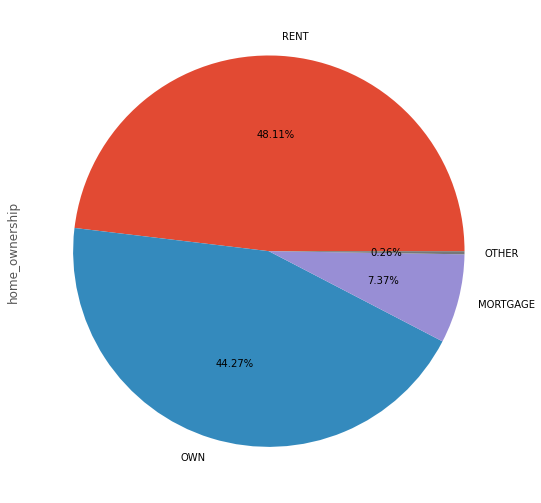

In [71]:
data = loan_applicants.home_ownership.value_counts()
# plotting pie chart for ownerships that atleast accoutn for 1% of all ownerships
data[data/data.values.sum() > 0.001].plot.pie(labels=loan_applicants.home_ownership.unique(), autopct='%1.2f%%');

- **Observation** <br/>
There are 4 kinds of ownerships that a loan applicant can have on his house. Most of the people live in a rented house, seconded by people who are having their own house. We see that the difference isnt much between these two (~3.5%), but the third kind is Mortgage which is significantly less at 7%.

#### 3.  Grade
Let's move to analyse our second variable - `grade`

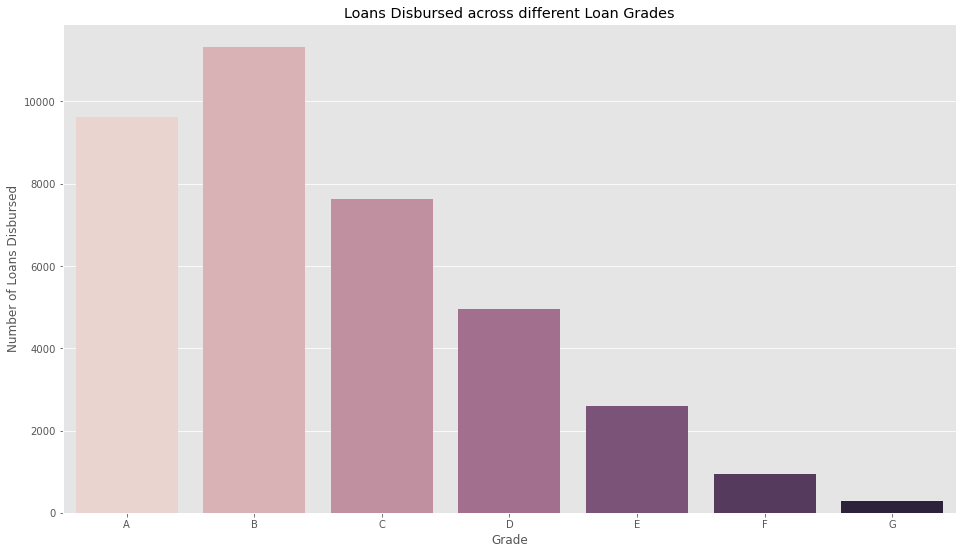

In [72]:
# Calculating Loans given in each Loan Grades
counts = loan_applicants.grade.value_counts()
# Plotting the Chart
axes = sns.barplot(x=counts.index, y=counts, palette='ch:0');
# Setting Axes labels and title of the chart
axes.set(xlabel='Grade',ylabel='Number of Loans Disbursed', title='Loans Disbursed across different Loan Grades');

- **Observation** <br/>
Most of the loans are provided to borrowers who fall into the Grade B of LC Loan Grading System. <br/>Please refer 'References' for details on LC Grading System.

- **Inference** <br/>
From Grade A to G, risk increases and so does interest rate. Hence, people with lower risk are provied loans. But with Grade A (having least risk), interest is also least. Grade B is falls into the sweet spot of both and hence it is the category within which most borrowers are lent loans.

#### 4. Subgrade
From Grade, let's inspect its subcategories since they look promising to convey more insights about grade and how grade and subgrade can define Lending Club risk analysis strategies.

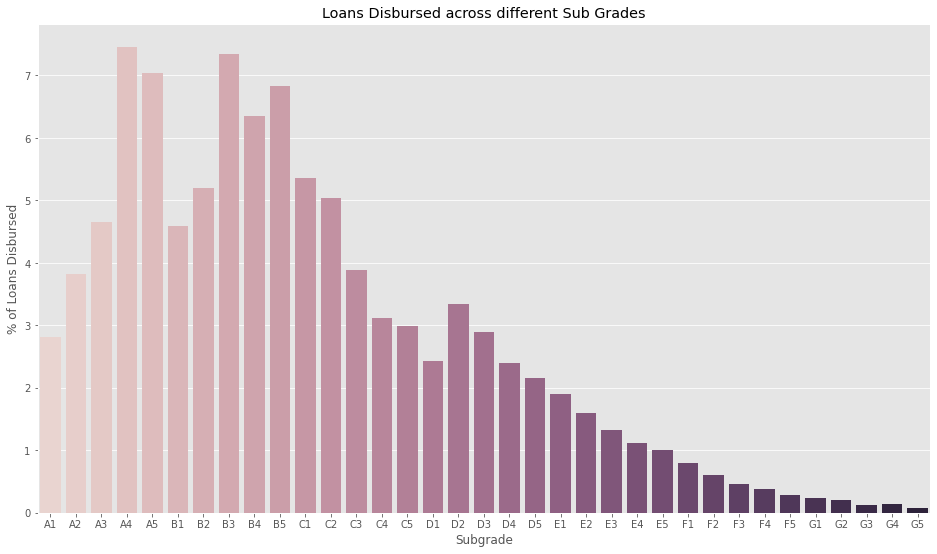

In [73]:
# Calculating proportion of loans given in each Loan Subgrade
counts = loan_applicants.sub_grade.value_counts(normalize=True)
# Plotting the Chart
axes = sns.barplot(data=loan_applicants, x=counts.index, y=counts*100, palette='ch:0');
# Setting Axes labels and title of the chart
axes.set(xlabel='Subgrade', ylabel='% of Loans Disbursed', title='Loans Disbursed across different Sub Grades');

- **Observations** <br/>
Most of the loan (>7%) being lent to people fall under the A4, A5, and B3 subgrades of loan grades. 

- **Inference** <br/>
Loan Subgrade, as the title suggests, follows pattern the same as loan grade.

However, we can analyse it further to test whether it is actually coinciding with loan grades.

In [74]:
# Finding Loans Disbursed in each grade and subgrade
counts = loan_applicants.groupby(by=['grade', 'sub_grade'])['sub_grade'].count()
# Reset index to convert from MultiIndex to Index
counts = counts.rename('frequency').reset_index()
# Filter out the pairs like A->G1, or C->D1 which will have frequency 0
counts = counts[counts.frequency !=0]
# Reset index to convert from MultiIndex to Index
counts = counts.reset_index(drop=True)
counts.head()

,grade,sub_grade,frequency
0,A,A1,1050
1,A,A2,1429
2,A,A3,1737
3,A,A4,2787
4,A,A5,2628


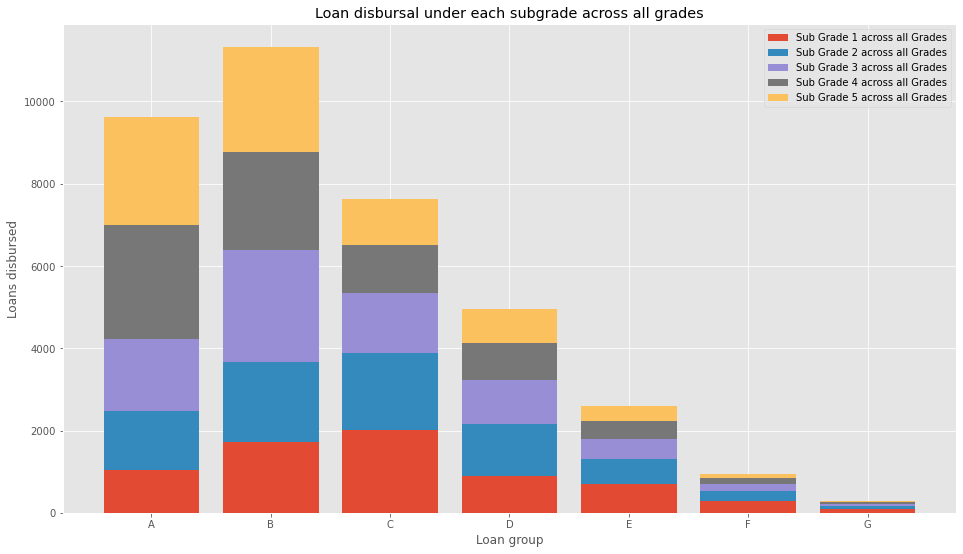

In [75]:
start=0
end=30
bottom = np.array([0,0,0,0,0,0,0])
idx=0
# loop over each subgrade to plot their count across all Grades
for i in range(5):
    bars = counts.frequency[start:end+1:5]
    plt.bar(range(7), bars, bottom = bottom, label='Sub Grade '+str(idx+1)+' across all Grades');
    start+=1
    end+=1
    # Set bottom of next barplot to current heights of already drawn bars
    bottom=np.add(list(bars), list(bottom))
    idx+=1

# Setting Axes labels and title of the chart
plt.xticks(range(7), counts.grade.unique());
plt.xlabel('Loan group');
plt.ylabel('Loans disbursed');
plt.title('Loan disbursal under each subgrade across all grades');
# Adding Legend
plt.legend()

- **Observation**<br/>
Number of Loans dispersed in each Subgrade across all Grades accumulate to the number of loans disbursed in each Grade analysed independently.

- **Inference**<br/>
Loans and Subgrades are highly correlated variables

#### 5. Funded Amount
Let's move to our next variable funded_amnt.

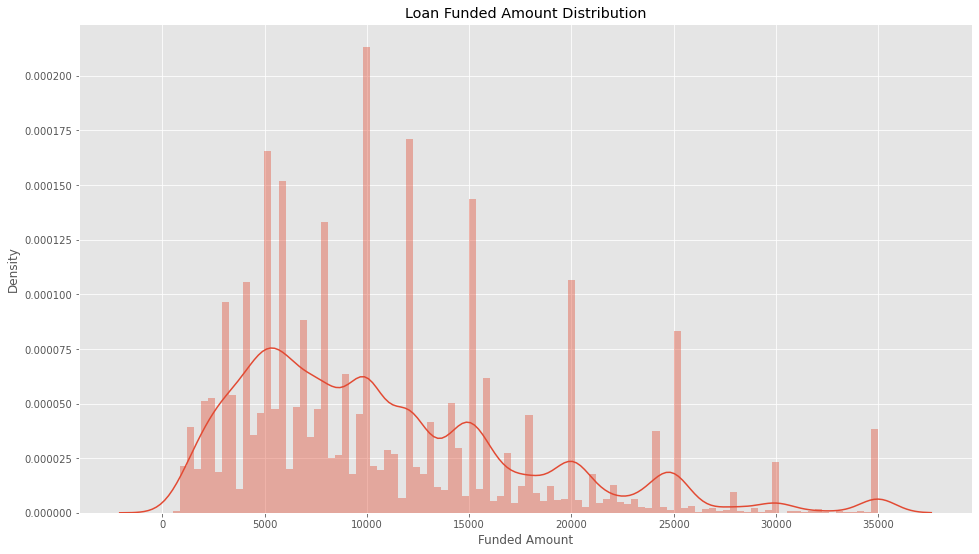

In [76]:
# Create a distribution chart for Funded Amount
g = sns.distplot(loan_applicants.funded_amnt,bins=100)
# Setting Axes labels and title of the chart
g.set(title='Loan Funded Amount Distribution', xlabel='Funded Amount');

- **Observations** <br/>
1. The distribution of funded amount is a positively skewed. 
2. It is worth noticing that there are few spikes in the distribution. The visible trend in these spikes are that they occur at the multiples of 5000- 5K, 10K, 15K, etc. 

- **Inference**<br/>
1. Loans for Lower Loan Amount are funded more than with higher amount.
2. Borrowers and Investors prefer to take/grant loans for an amount which is rounded off to the nearest 5K/10K multiple. Amounts like 2000, 13000 are less likely to be applied for. Instead these will be rounded off to 5000 and 15000 respectively.

#### 6. Loan Amount 

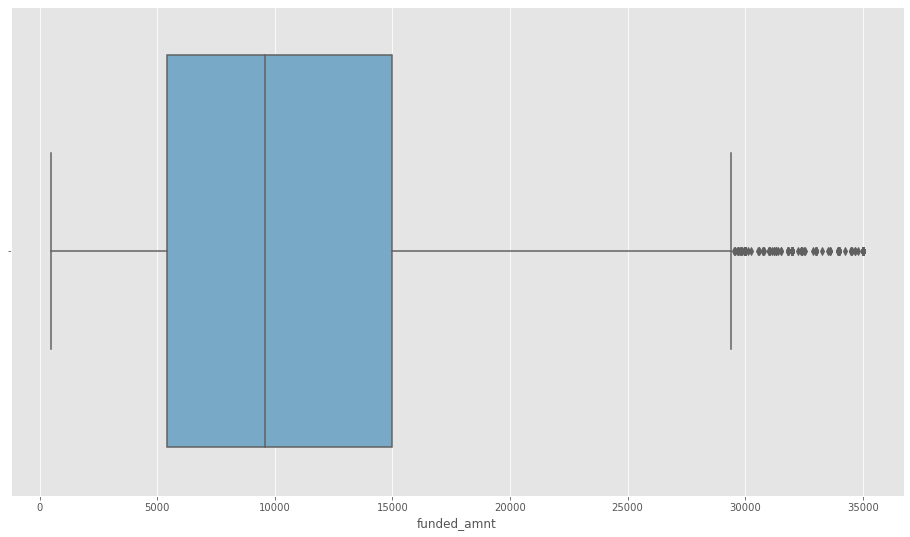

In [77]:
#Plotting box plot for loan_amnt
sns.boxplot(data=loan_applicants,x='funded_amnt',palette='Blues');

- **Observations**<br/>
The whiskers of Box plot are located around 0 and 29000. There are several outliers present in the dataset

- **Inference** <br/>
It is inferred from the above box plot, that there is a presence of outliers with loan amount.

Note: The data lies between 0 to 35000. First we need to find the lower and upper bound. To remove outliers, we shall be using capping method for upper bound at 90th percentile

In [78]:
#Finding Q1 and Q3
q1 = loan_applicants.funded_amnt.quantile(0.25)
q3 = loan_applicants.funded_amnt.quantile(0.75)

#calculating iqr 
iqr = q3 - q1

#calculating upper bound at 95th percentile
q95 = loan_applicants.funded_amnt.quantile(0.95)
ub = q3+1.5*iqr

print("95th percentile of Loan Amount requestsed by Applicant : " +str(q95))
print("UB of Loan Amount requestsed by Applicant : " +str(ub))


95th percentile of Loan Amount requestsed by Applicant : 25000.0
UB of Loan Amount requestsed by Applicant : 29400.0


Our upper bound is 25000, and the loan_amount goes upto the max value of 35000. Let's find out how many such outliers are present.

In [79]:
# Calculating the percentage of outlier values in the loan_amnt
(loan_applicants[loan_applicants.loan_amnt > 29400].loan_amnt.count() * 100 ) / loan_applicants.loan_amnt.count()

2.8688414911552975

Loan amount outliers only constitute about 3% of data. We shall remove these values

In [80]:
# Removing outiers for loan_amnt above 95th percentile
loan_applicants = loan_applicants[loan_applicants.funded_amnt <= q95]
loan_applicants.shape

(36121, 31)

#### 7. Term
Any loan extended has a term in which the borrower will have to pay installments and complete its pay off for the loan. So, it is expected to be be a contributing factor to loan repayment ability of a borrower. Let's analyse what are the most common loan term that people are taking loan for.

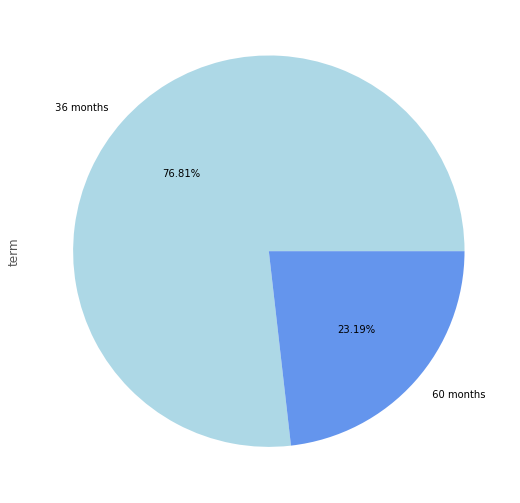

In [81]:
#Plotting pie chart of term
loan_applicants['term'].value_counts().plot(kind='pie',colors=[ 'lightblue', 'cornflowerblue'],autopct='%1.2f%%');

- **Observations** <br/>
There are only two kinds of terms borrowers are taking loan for- 36 months or 60 months. This is in coherence with the fact that LC has two terminal durations in their loan granting policies- 3 year(36 months) or 5 year(60 months)
Please refer the 'References' for Term policies

- **Inference**<br/>
From the chart, it is evident that LC favors giving loans to borrowers for lesser term i.e. 36 months.

#### 8. Purpose of loan
Let's analyse one more variable i.e. Purpose of taking the loan

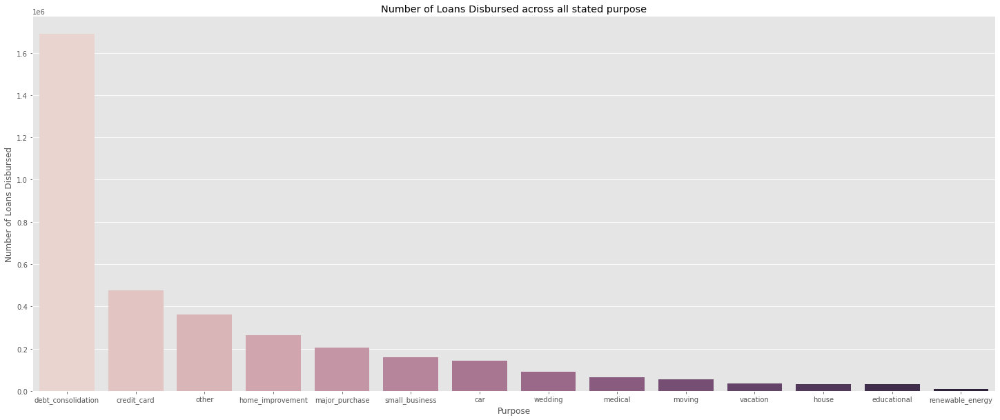

In [82]:
plt.figure(figsize=(25,10))
# Finding the loans disbursed for each purpose
count2 = loan_applicants.purpose.value_counts()
#Plotting the Chart
axes = sns.barplot(x=count2.index, y=count2*100, palette='ch:0',order=count2.index);
# Setting Axes labels and title of the chart
axes.set(xlabel='Purpose', ylabel='Number of Loans Disbursed', title="Number of Loans Disbursed across all stated purpose");

From the above plot it is inferreed that mostly the loans have been taken for debt_consolidation.

#### 7. Annual income of Applicant
Let's analyse Annual Income of loan applicants now

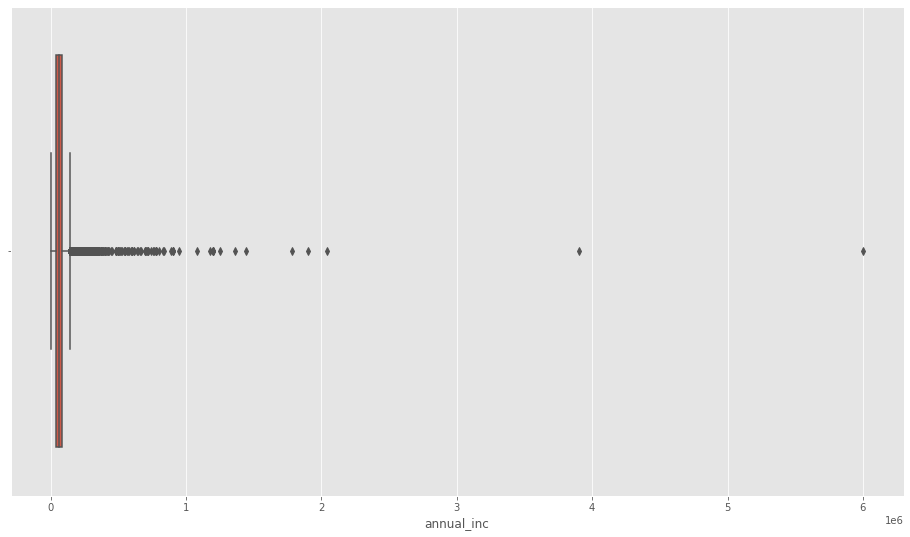

In [83]:
#Plotting box plot for annual income
sns.boxplot(data=loan_applicants, x="annual_inc");

- **Observations**<br/>
The whiskers of Box plot are located around 0 and 20000. There are several outliers present in the dataset.

- **Inference** <br/>
It is inferred from the above box plot, that there is a presence of outliers with loan amount.

In [84]:
#Finding Q1 and Q3
q1_inc = loan_applicants['annual_inc'].quantile(0.25)
q3_inc = loan_applicants['annual_inc'].quantile(0.75)

#calculating iqr 
iqr_inc = q3_inc - q1_inc

#calculating upper bound at 95th percentile
q95 = loan_applicants.annual_inc.quantile(0.95)

print("95th percentile of Annual Income of Applicant : " +str(q95))

95th percentile of Annual Income of Applicant : 138000.0


There are several people with exceptionally high income relative to the other borrowers in the dataset. Let's drop the outliers from annual_inc variable.

In [85]:
# Removing outiers for annual_inc above 95th percentile
loan_applicants = loan_applicants[loan_applicants.annual_inc < q95]

In [86]:
# Plotting a chart for borrowers with extreme high income relative to others
high_income_applicants = loan_applicants[loan_applicants.annual_inc > q95]

#### 8. Revolving Credit Utilisation

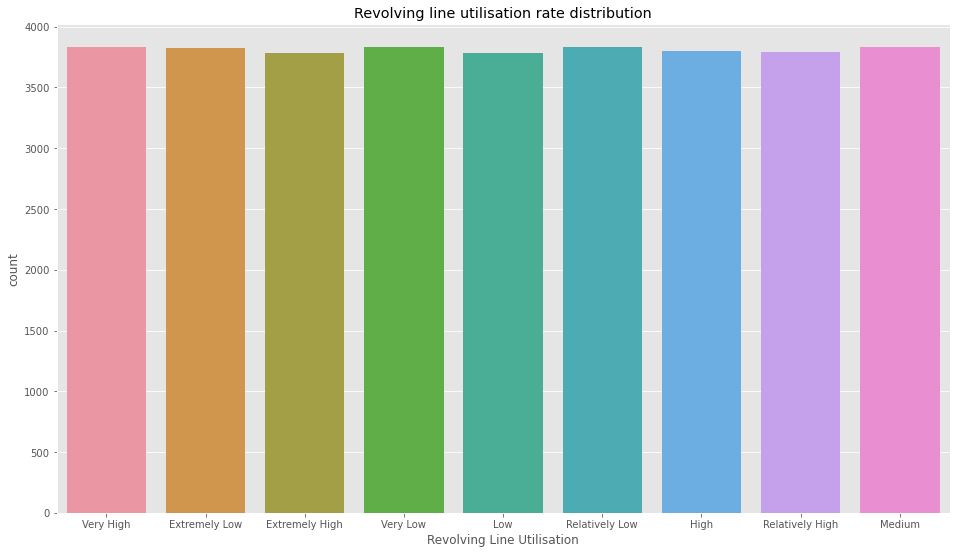

In [87]:
#Creating segmentor with 9 segments
segmentor = segmentor_def(9, loan_applicants, 'revol_util')
# Deriving new metric for revolving utilisation rate
loan_applicants['revol_util_segments'] = loan_applicants.revol_util.apply(segmentor)
# Plotting the chart
axes = sns.countplot(data=loan_applicants, x='revol_util_segments');
# Setting Axes labels and title of the chart
axes.set(title='Revolving line utilisation rate distribution', xlabel='Revolving Line Utilisation');

- **Observation**<br/>
All bars of revolving line utilisation rate segments are having approx equal heights.

- **Inference**<br/>
Revolving line utilisation rate is evenly distributed across the dataset

### Segmented Univariate Analysis

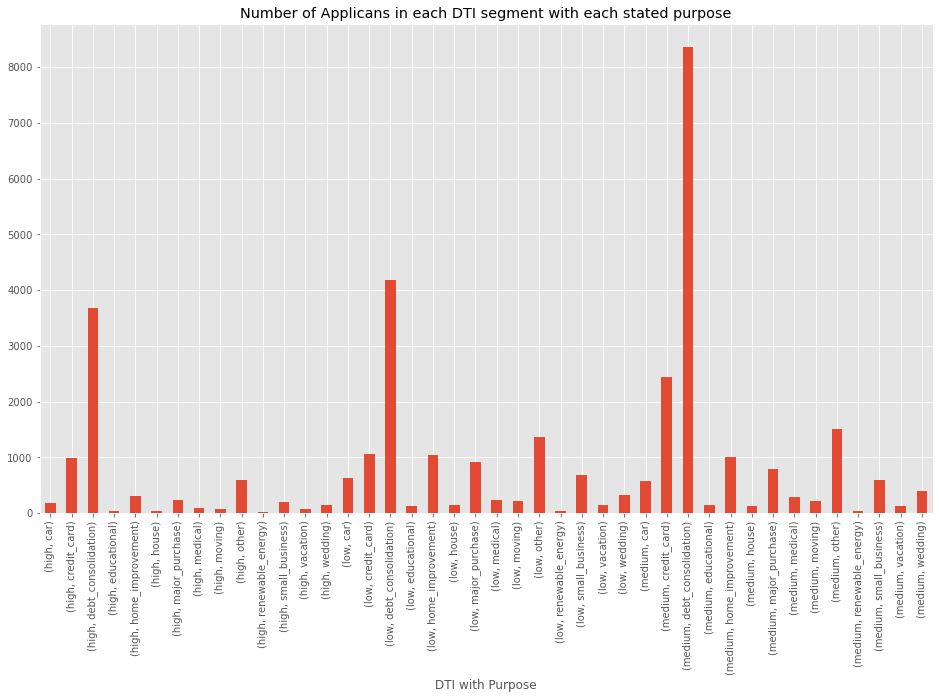

In [88]:
# finding borrowers which default and have extreme high income
counts = loan_applicants.groupby(by=['dti_segment', 'purpose']).count()['loan_status']
# Plotting the chart
# counts.plot.pie(autopct='%1.2f%%', colors=[ 'lightblue', 'cornflowerblue']);
axes = counts.plot.bar();
axes.set(title='Number of Applicans in each DTI segment with each stated purpose',xlabel='DTI with Purpose');

## Variables independently affecting the loan status a.k.a. Bivariate Analysis

To continue our analysis, we need some insights as to which variables might be holding any relationship with each other. We can use a technique for getting some clue about the same on numerical data. To find that, we would use Person's r as Corrlation coefficient between all numerical variables.

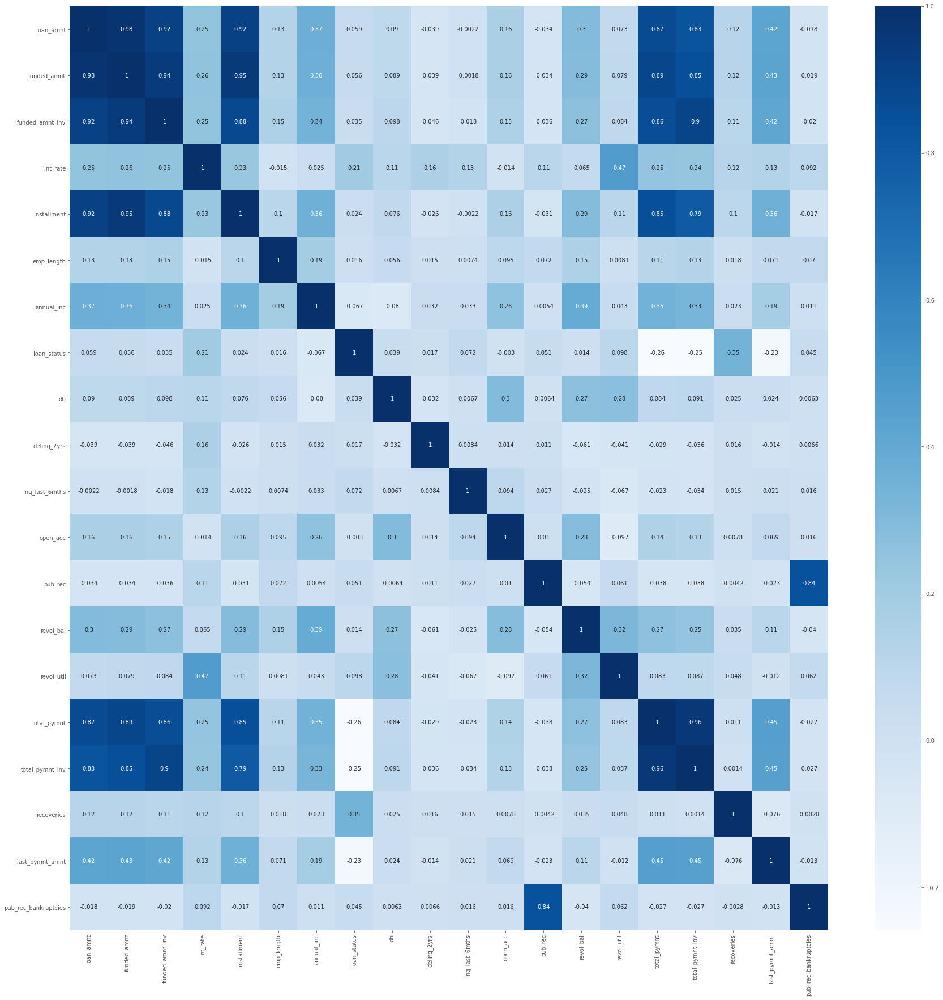

In [89]:
plt.figure(figsize=(30, 30))
# Plotting chart for correlation between all numerical variables
sns.heatmap(data=loan_applicants.corr(), cmap='Blues', annot=True);

We can see there are some clusters formed in the correlation matrix in which members have high correlation with one another.  This shows there are groups of variables that depend on each other: 
 - **Amounts**: funded_amnt, loan_amnt, funded_amnt_inv are correlated with each other
 - **Payments**: total_payment, total_payment_inv, total_rec_prncp, total_rec_int are correlated with each other
 - Both Amounts and Payments are correlated with each other

#### 1. Loan Status v/s Loan Term

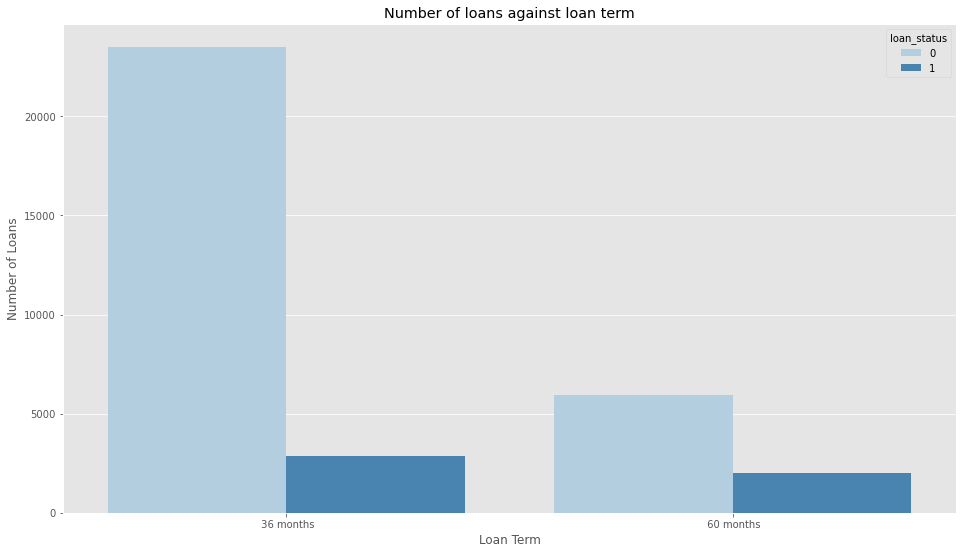

In [90]:
# Plotting the chart
axes = sns.countplot(data=loan_applicants, x='term',hue='loan_status', palette='Blues');
# Setting Axes labels and title of the chart
axes.set(xlabel='Loan Term', ylabel='Number of Loans',title='Number of loans against loan term');

- **Observations**<br/>
1. The Number of defaulted loans are more in 36 month term than in 60 month term.
2. The Number of defaulted loans are much lower than the Fully Paid loans in proportion.

- **Inference**<br/>
1. Borrowers taking 36 month term for loans are likely to default than 60 month term
2. This is in coherence with observation made during loan_status analysis that defaulted loans are lower in propertion.

#### 2. Revolving Line utilisation Rate v/s Loan Status (Loan Defaults)

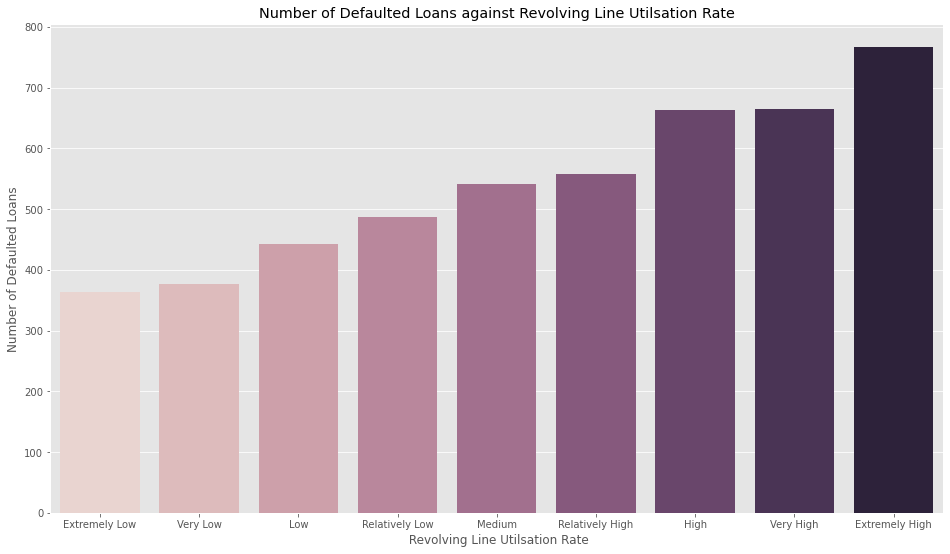

In [91]:
# Plotting the chart
axes = sns.barplot(data=loan_applicants, x='revol_util_segments', y='loan_status', estimator=np.sum, ci=None, order=['Extremely Low', 'Very Low', 'Low', 'Relatively Low', 'Medium', 'Relatively High', 'High', 'Very High', 'Extremely High'], palette='ch:0');
# Setting Axes labels and title of the chart
axes.set(title='Number of Defaulted Loans against Revolving Line Utilsation Rate', xlabel=' Revolving Line Utilsation Rate', ylabel='Number of Defaulted Loans');

- **Observation** <br/>
The number of defaulted loans increase with the increase in Revolving line Utilisation Rate

- **Inference** <br/>
With increase in revol_util, the risk of loan being defaulted increases.


#### 3. Term vs Interest Rates v/s Loan Defaults 

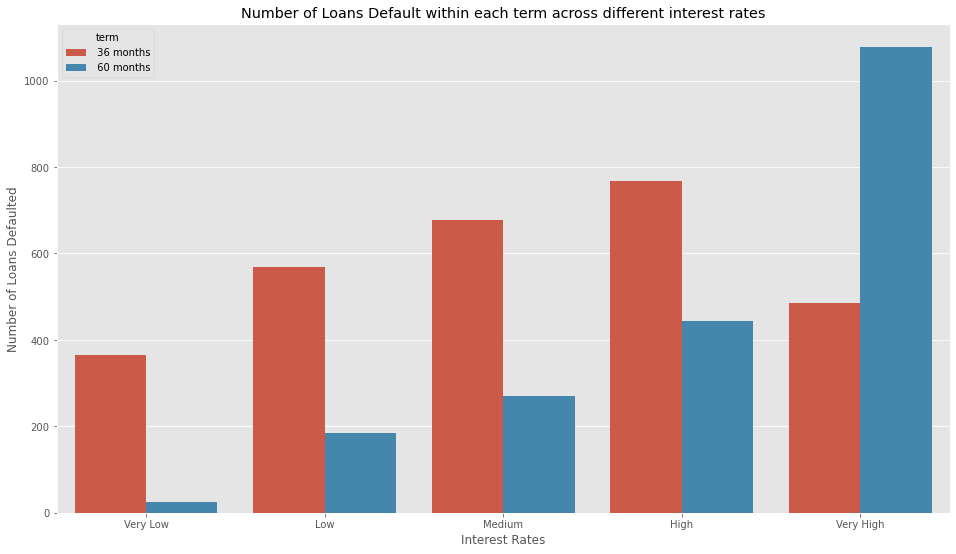

In [92]:
# finding the loans marked as Charged Off for each interest rate segment for each term
lchrgd=pd.DataFrame(loan_applicants[loan_applicants.loan_status==1].groupby(by=['int_rate_segment','term'])['loan_status'].sum().rename('Count'))
lchrgd.reset_index(inplace=True)
# Plotting the chart of Number of Defaulters in each loan term across different interest rates
segment_levels = ['Very Low', 'Low', 'Medium', 'High', 'Very High']
axes = sns.barplot(data=lchrgd,x='int_rate_segment',y='Count',hue='term', order=segment_levels);
# Setting Axes labels and title of the chart
axes.set(xlabel='Interest Rates', ylabel='Number of Loans Defaulted', title='Number of Loans Default within each term across different interest rates');

- **Observation**<br/>
1. There is a steady increase in number of defaulted loans going from low interest rates to high (including both terms)
2. Number of defaulted loans are more for 36 month term as compared to 60month term across all interest rate segments, except Very High interest rates. 

- **Inference**<br/>
1. IF considered both terms, the number of defaulting loans are constantly increasing. This could be because of the increasing interests that people are unable to pay the hefty sum of installments.
2. The defaulted loans across any of the interest rate segment (except Very High) are more in 36 month term. However for Very high interest rates, defaulters are more in 60 month term. This is something LC can investigate into why this behaviour is obsevred.

#### 4. Annual income v/s Loan Status (Defaulted Loans)
Let's see the relation between the annual_inc of borrowers with the default rate.

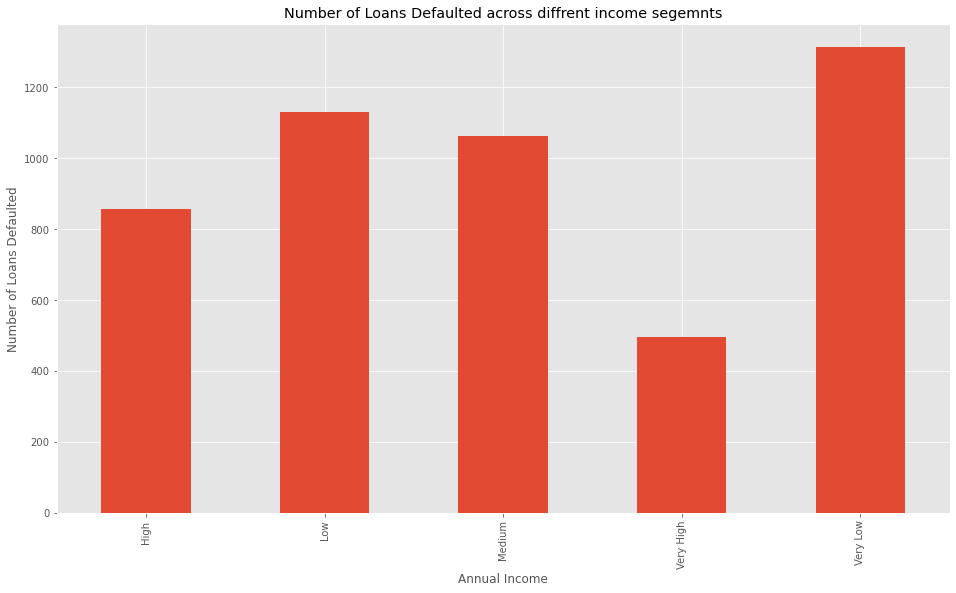

In [93]:
# Finding number of defaulters in each annual income segment
counts = loan_applicants.groupby(by='annual_inc_segment').sum()['loan_status']
# Plotting the chart
axes = counts.plot.bar()
# Setting Axes labels and title of the chart
axes.set(xlabel='Annual Income', ylabel='Number of Loans Defaulted',title='Number of Loans Defaulted across diffrent income segemnts');

- **Observations** <br/>
1. Borrowers with very high annual income have the least number of default loans
2. Borrowers with very low annual income have the highest number of default loans
3. As annual income increases, the number of loan default decreases.

- **Inference** <br/>
Annual income is having an impact over loan repayment capacity of Borrowers. Borrowers with higher income are 'safe' for loan disbursal.

#### 5. Home Ownership status v/s Loan Status

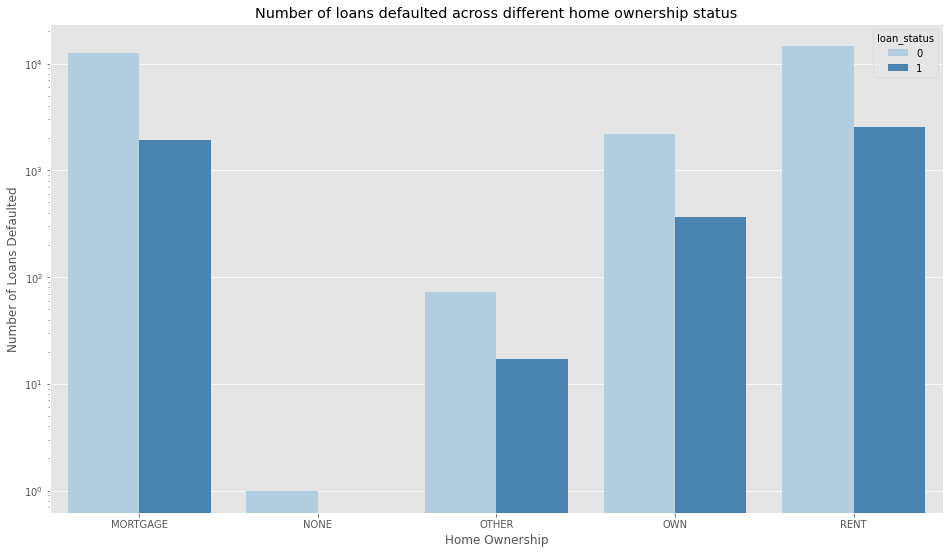

In [94]:
# Plotting the chart
axes = sns.countplot(data=loan_applicants, x='home_ownership',hue='loan_status', palette='Blues');
# Setting Axes labels and title of the chart
axes.set(xlabel='Home Ownership',ylabel='Number of Loans Defaulted', title='Number of loans defaulted across different home ownership status', yscale='log');

- **Observations** <br/>
1. Rented Home Ownership has the highest number of defaulted loans. Interestingly, mortgage comes second very close.
2. Other Home Ownership has a very low number of defaulted loans

- **Inference** <br/>
1. People with rented/mortgaged homes are more likely to default.
2. Borrowers with their own homes can be said they have least number of defaulted loans. Home Ownership status as Other's cannot be conclusive because it might be sum of few statuses, ones which might not be fitting to either of mortgaged, owned or rented.

#### 6. Debt to Income Ratio v/s Loan Status

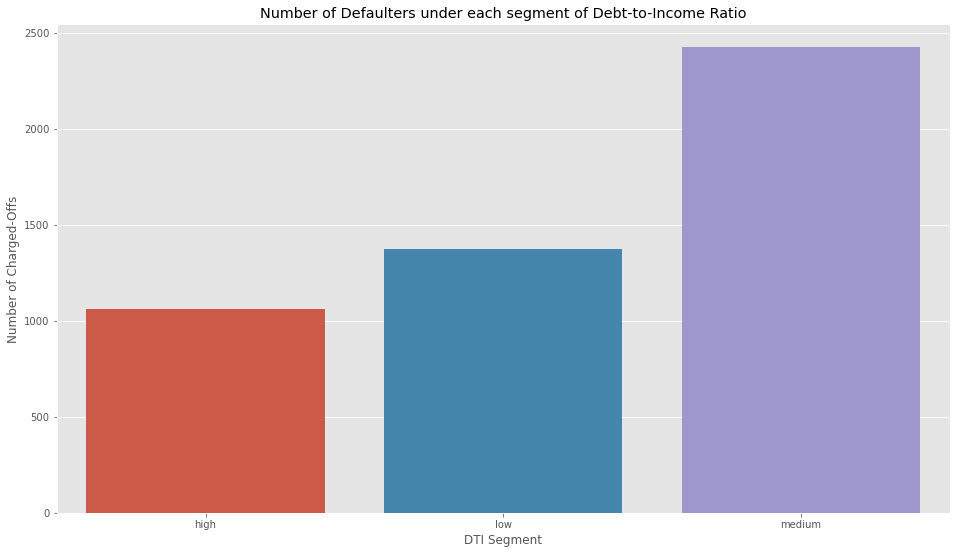

In [95]:
# Finding the number of defaulters in each DTI segment
dti_vs_loan_status = loan_applicants.groupby(by=['dti_segment'])['loan_status'].sum()   # Sum will give count of all Loans which are charged off
dti_vs_loan_status = pd.DataFrame(dti_vs_loan_status)
# plotting the chart
axes = sns.barplot(data=dti_vs_loan_status, y='loan_status', x=dti_vs_loan_status.index);
# Setting Axes labels and title of the chart
axes.set(title='Number of Defaulters under each segment of Debt-to-Income Ratio', xlabel='DTI Segment', ylabel='Number of Charged-Offs');

- **Observations** <br/>
DTI Segment with High DTI have the least number of default loans

- **Inference** <br/>
Applicants with high DTI are safe to lend out loans to.

#### 7. Funded Amount by investors v/s Annual income v/s Loan Status

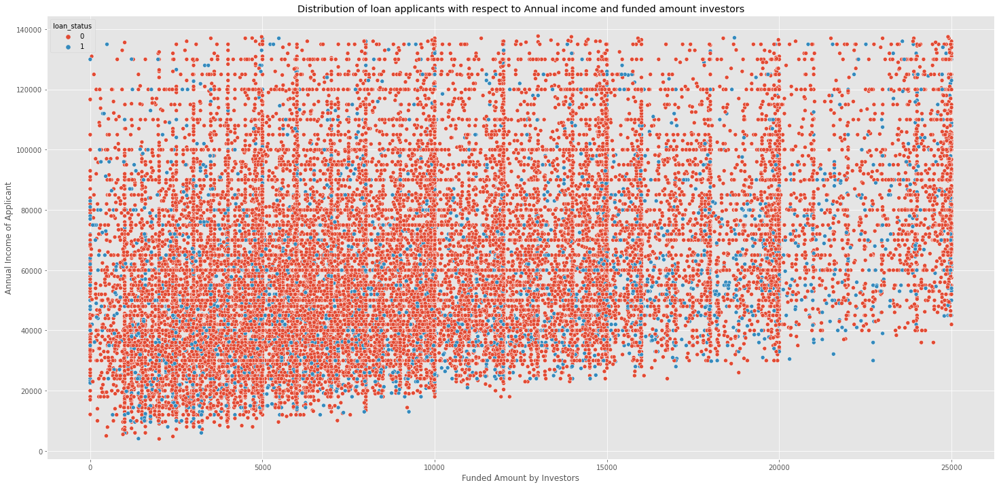

In [96]:
#Changing the figure size
plt.figure(figsize=(25, 12))
# Plotting the chart
axes = sns.scatterplot(data=loan_applicants, x='funded_amnt_inv', y='annual_inc', hue='loan_status');
# Setting Axes labels and title of the chart
axes.set(title='Distribution of loan applicants with respect to Annual income and funded amount investors', xlabel='Funded Amount by Investors', ylabel='Annual Income of Applicant');

- ** Observations** <br/>
1. There is a empty area at the bottom that increases as funded amount increases (forms a triangle). 
2. Most of the applicants (& loans are disbursed ) are concentrated at the left bottom corner of the chart *(relatively)*

- **Inference** <br/>
1. The empty area depicts there are no applicants with corresponding amount of funding and annual income. This could be because people with less annual income would not be apporved for high amount of loan. (For example, Annual income of 20000 and funded amount 250000)
2. Most of the loans disbursed are of amount < 15000. There are some exceptions, however, for the same annual income, which might be due to the applicant's credit score and repayment history. Also, there are exceptions when people have a high income which could reduce risk of default.


**However, this could also be filtered for only defaulted loans**

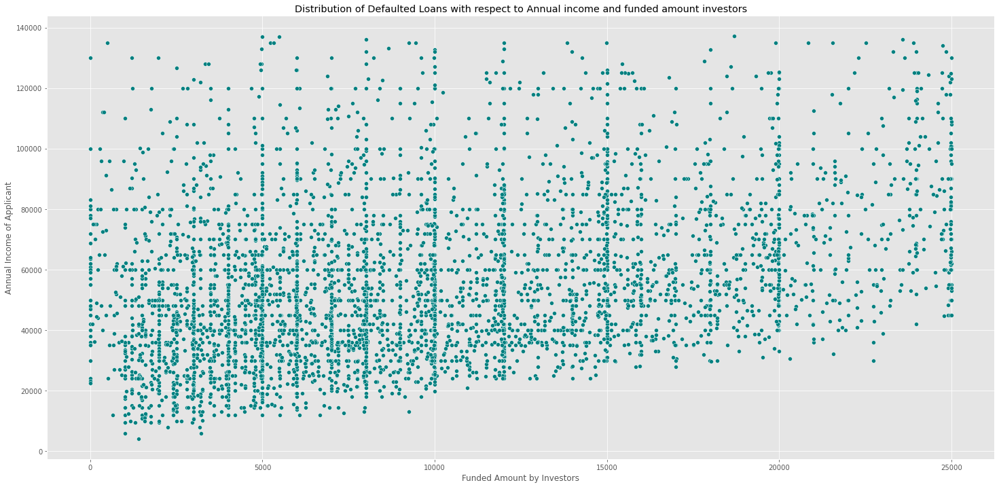

In [97]:
plt.figure(figsize=(25, 12))
# # Plotting the chart for annual income vs Funded amount ONLY for defaulted loans
axes = sns.scatterplot(data=loan_applicants[loan_applicants.loan_status == 1], x='funded_amnt_inv', y='annual_inc', color='teal');
# Setting Axes labels and title of the chart
axes.set(title='Distribution of Defaulted Loans with respect to Annual income and funded amount investors', xlabel='Funded Amount by Investors', ylabel='Annual Income of Applicant');

- **Observation**
1. Loans that are charged off are *relatively* more clustered at the lower side of the Funded Amount.
2. *Vertical lines* can be noticed forming at regular intervals of the Funded Amount, like at 5000, 10000, 12000, 15000, etc.
- **Inference**
1. Applicants with lower side of income apply *and are approved by LC* for lower fund amount (<10000). These people are likely to default. However, on the contrary, as seen previously, more and more number of loans are taken by the borrower whose annual income is at the lower end of spectrum. And most of these loans DO get fully paid.<br/> Hence, it cannot be said concretely that people with lower end of annual income would likely default. 
But it can be said that the people at higher end of income are very safe to invest in and such loans would not convert to Charge-Offs
2. Most borrowers apply for loan amount, and hence are funded an amount, in muliples of 1000

#### 8. Stated Purpose of Loan v/s Loan Status

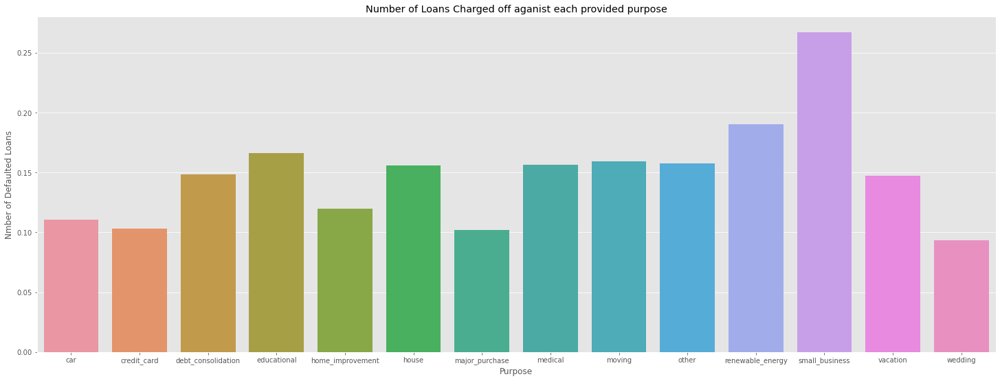

In [98]:
plt.figure(figsize=(25, 9))
axes = sns.barplot(data=loan_applicants, x='purpose', y='loan_status', ci=None);
axes.set(title='Number of Loans Charged off aganist each provided purpose', ylabel='Nmber of Defaulted Loans', xlabel='Purpose');

- **Observation**
1. Small Businesses which are taking loans are having the highest number of Charge-Off's
2. Interestingly, the least amount of charge-offs are found when purpose stated for loan was for Wedding.
3. Loans taken for necessities like Medical, Education are having higher charge off rates
- **Inference**
1. Small Businesses are having high risk associated with them. One of the reason this could be attributed to, is that the people start with small businesses and for that they take loans as they might not be having enough money with them. However, it is very common that a business might not succeed and would cause *bankruptcy*
2. Wedding seems to be least risky. This could be because the borrowers who are taking loan for wedding come from backgrounds where grand wedding might be a luxury for them, but they might be having a healthy source of income to pay it off.

#### 9. Verification Status v/s Loan Status

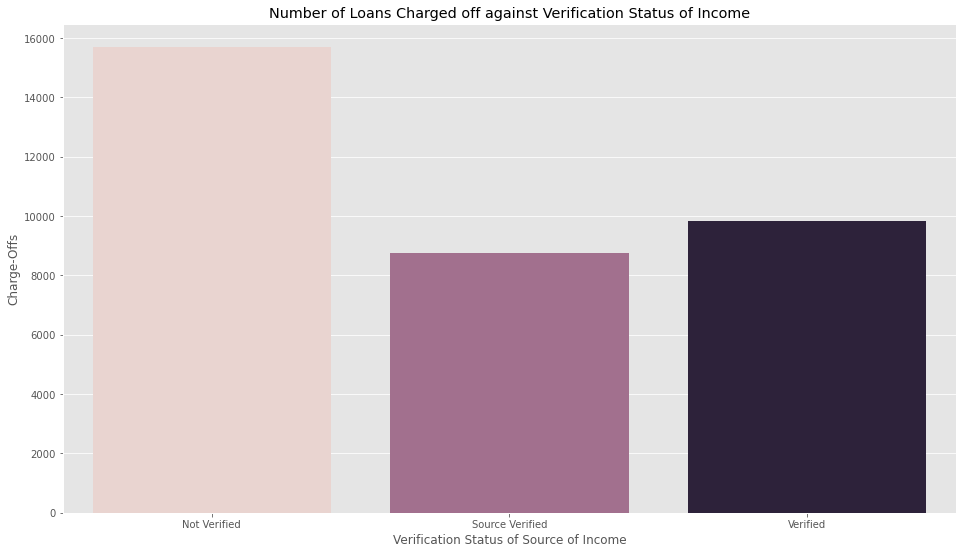

In [99]:
axes = sns.barplot(data=loan_applicants, x='verification_status', y='loan_status', estimator=len, palette='ch:0');
axes.set(title='Number of Loans Charged off against Verification Status of Income', xlabel='Verification Status of Source of Income', ylabel='Charge-Offs');

- **Observation** <br/>
Most number of default cases are encountered if the verification status is Not Verified

- **Inference** <br/>
Verification is an important part of loan disbursal process to mitigate the number of default cases.

#### 10. Residential State of Applicant v/s Loan Status

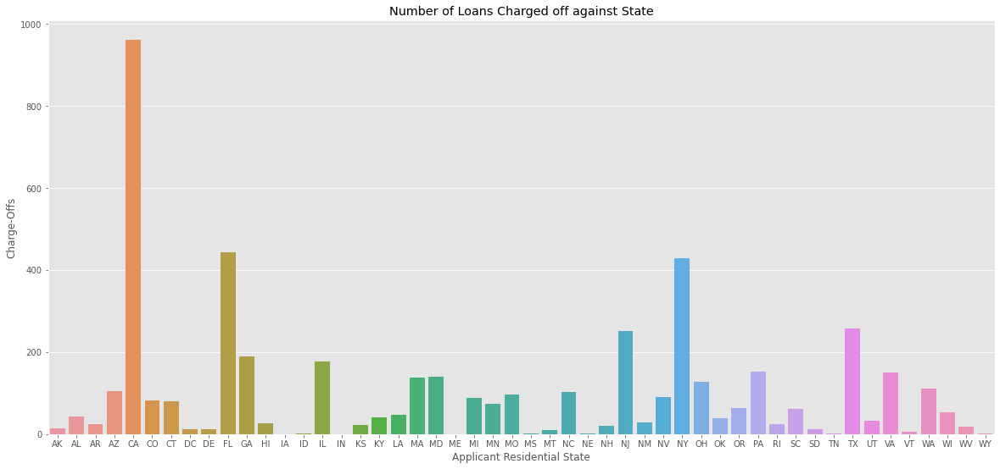

In [100]:
plt.figure(figsize=(20, 9))
# loan_applicants.groupby(by='addr_state')['loan_status'].sum()
axes = sns.barplot(data=loan_applicants, x='addr_state', y='loan_status', estimator=np.sum, ci=None);
axes.set(title='Number of Loans Charged off against State', xlabel='Applicant Residential State', ylabel='Charge-Offs');

- **Observation: ** <br/>
CA state is the state with highest number of loan default cases

## Summary
Many variables in the given dataset can impact the defaulting of a loan and hence are really important driving factor for business. Some of the variables as per inference are listed below:<br/>
 -  Borrowers with Verification Status as not verified are the most risky. Hence verification is very necessary. <br/>
 - Loans with higher interest rates have higher chances of default.<br/>
 - Small Businesses are the most risky borrowers due to uncertainty in business flourishing, followed by Renewable energy sector as it is   budding.<br/>
 - Applicants with high Debt to Income Ratio should be preferred.<br/>
 - Annual Income of the borrower is one of the most important factor. People with low annual income are having higher chances of defaulting and  should be avoided or charged higher interest rates.<br/>
 - Applicants with high utilisation of revolving line are having more risk of defaulting.<br/>
 - Residential State is a factor which affects the default rate a lot. Each state has a different default rate, however, the most risky states are CA,NY and FL.<br/>

#### References:
1. [LC Grading System](https://www.lendingclub.com/foliofn/rateDetail.action.)
2. [What are the terms of loans?- LendingClub] (https://help.lendingclub.com/hc/en-us/articles/215466718-What-are-the-terms-of-the-loans-#:~:text=Loans%20have%20either%203%2Dyear,include%20both%20interest%20and%20principal.)